<a href="https://colab.research.google.com/github/balamurugan-palaniappan-CEP/AIML_CEP_2021/blob/main/Optimization/Optimization_in_Logistic_Regression_TA_session_Dec_18.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Logistic Regression

In this session, we shall develop optimization algorithms for logistic regression.

In [1]:
#First, we import the required packages
import pandas as pd #the pandas library is useful for data processing 
import numpy as np #numpy package will be useful for numerical computations
import matplotlib.pyplot as plt #the matplotlib library is useful for plotting purposes
import random

# The following python directive helps to plot the graph in the notebook directly
%matplotlib inline

Now let us consider some open source data sets available in the internet.

In [2]:
from sklearn.datasets import load_iris  #importing the load_iris class
iris_data = load_iris() #loading the iris dataset in iris_data

print(iris_data['DESCR']) #checking out the description of the dataset

.. _iris_dataset:

Iris plants dataset
--------------------

**Data Set Characteristics:**

    :Number of Instances: 150 (50 in each of three classes)
    :Number of Attributes: 4 numeric, predictive attributes and the class
    :Attribute Information:
        - sepal length in cm
        - sepal width in cm
        - petal length in cm
        - petal width in cm
        - class:
                - Iris-Setosa
                - Iris-Versicolour
                - Iris-Virginica
                
    :Summary Statistics:

    ============== ==== ==== ======= ===== ====================
                    Min  Max   Mean    SD   Class Correlation
    ============== ==== ==== ======= ===== ====================
    sepal length:   4.3  7.9   5.84   0.83    0.7826
    sepal width:    2.0  4.4   3.05   0.43   -0.4194
    petal length:   1.0  6.9   3.76   1.76    0.9490  (high!)
    petal width:    0.1  2.5   1.20   0.76    0.9565  (high!)
    ============== ==== ==== ======= ===== ===========

In [9]:
#print first few rows of iris data set
iris_data['data'][:5]

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2]])

In [14]:
#Let us consider first two features of the IRIS data set 
X = iris_data['data'][:,:2]
#print(X)




In [16]:
idx = np.array(np.arange(len(X)))
np.random.shuffle(idx)

X = X[idx[0:60],:]
print(X.shape)

(60, 2)


From the description, it is clear that *iris* dataset consists of essentially 3 classes: *Iris-Setosa*, *Iris-Versicolour*, *Iris-Virginica*. As logistic regression has been introduced as a binary classifier, we can alter the data into a binary classification problem based on finding whether a flower belongs to *Iris-Virginica* or not. In order to do that, we change the labels $\{0,1\}$ to $-1$ and 2 to 1.

In [19]:
y = np.where(iris_data['target'] == 2, 1, -1) #shorthand notation to change all labels other than 2 as 0 and 2 as 1
y = y[idx[0:60]]
print(y)

[-1 -1 -1 -1 -1  1 -1 -1  1 -1 -1  1  1 -1 -1  1 -1 -1 -1  1 -1 -1 -1 -1
 -1 -1  1  1 -1 -1  1 -1  1 -1  1 -1 -1 -1 -1 -1  1 -1 -1 -1  1 -1  1  1
 -1  1  1 -1  1  1  1 -1 -1  1 -1 -1]


In [20]:
#Let us consider 70% of X for training
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 1)
print('Size of training set:', len(X_train))
n = len(X_train)
print('Size of testing set:', len(X_test))
print(y_test)

Size of training set: 42
Size of testing set: 18
[-1 -1 -1 -1  1  1 -1 -1  1  1 -1  1  1 -1  1 -1 -1 -1]


Recall, given the realization of $\mathbf{x}$ of the predictor random variable $X$, where $\mathbf{x} = \begin{bmatrix} x_1 \\ x_2\end{bmatrix}$, we can write the conditional expectation of the response variable $Y$ given the realization $\mathbf{x}$, we had $E[Y|X=\mathbf{x}]= p(\mathbf{x};\beta_1,\beta_2) =: p(\mathbf{x})$, where  parametrized probability function $p(\mathbf{x})$  is represented as:

$
p(\mathbf{x})=p(\mathbf{x};\beta_1,\beta_2) = \frac{1}{1+e^{-(\beta_1x_1 + \beta_2x_2)}}, \text{where }x_1,x_2\in\mathbb{R} \text{ and } \beta_1,\beta_2 \in \mathbb{R} \text{ are the parameters}.
$

If we denote $p(\mathbf{x})$ simply as $p$ and if we have the notations $\mathbf{x}=\begin{bmatrix}
x_1 \\ x_2
\end{bmatrix}, \beta=\begin{bmatrix}
\beta_1 \\ \beta_2
\end{bmatrix}$
then we can write:

$
\begin{align}
p = \frac{1}{1+e^{-\beta^\top \mathbf{x}}}.
\end{align}
$

Then note the following that the following algebraic manipulations hold:

$
\begin{align}
p &= \frac{1}{1+e^{-\beta^\top \mathbf{x}}} \\
\implies 1 + e^{-\beta^\top \mathbf{x}} &= \frac{1}{p} \\
\implies  e^{-\beta^\top \mathbf{x}} &= \frac{1}{p} - 1 \\
\implies  e^{-\beta^\top \mathbf{x}} &= \frac{1-p}{p} \\
\implies \ln e^{-\beta^\top \mathbf{x}} &= \ln \frac{1-p}{p} \\
\implies -\beta^\top \mathbf{x} &= \ln \frac{1-p}{p} \\
\implies \beta^\top \mathbf{x} &= \ln \frac{p}{1-p} \\
\implies \beta_1 x_1+\beta_2 x_2 &= \ln \frac{p}{1-p}.
\end{align}
$

Thus, even if we did not have a straightforward dependence of $Y$ on an observation $\mathbf{x}$ of $X$ as a linear relation, we see that the linear relation $\beta_1 x_1+ \beta_2 x_2$ is related to the probability $p$ using:

$
\ln\frac{p}{1-p}=\beta^\top \mathbf{x}.
$

Note that the ratio $\frac{p}{1-p}$ is called $\textbf{odds}$ that the event $Y=1$ occurs, and hence $\ln \frac{p}{1-p}$ denotes the $\textbf{log odds}$. 

More popularly, the log odds $\ln \frac{p}{1-p}$ is called the $\textbf{logit}$ function. 


As discussed earlier, in logistic regression we aim to solve the following optimization problem:
$$
\max_{\beta_1, \beta_2} \ln L(y^1,\ldots,y^n;p^1;\ldots,p^n)= \sum_{i=1}^{n} y^i \ln {(p^i)} + (1-y^i) \ln (1-p^i),
$$
where $p^i=p(x^i)= p(x^i; \beta_1, \beta_2) = \frac{1}{1+e^{-{(\beta_1x_1^i+ \beta_2 x_2^i)}}}$,
$x^i,\beta\in\mathbb{R}^2,\text{ and } y^i\in\{0,1\},\forall i = 1,\ldots,n$.

Provided the labels are $\{-1,1\}$ instead of $\{0,1\}$, using the probabilistic interpetation, we can write

$p(x)=p(x;\beta_1,\beta_2)=\frac{e^{(\beta_1x_1+\beta_2x_2)}}{1+e^{(\beta_1x_1+\beta_2x_2)}} = \frac{1}{1+e^{-(\beta_1x_1+\beta_2x_2)}}$. Then we can rewrite this as
$$P[y=1|x]=p(x)=\frac{e^{(\beta_1x_1+\beta_2x_2)}}{1+e^{(\beta_1x_1+\beta_2x_2)}}=\frac{1}{1+e^{-(\beta_1x_1+\beta_2x_2)}},$$
$$P[y=-1|x]=1-p(x)=\frac{1}{1+e^{(\beta_1x_1+\beta_2x_2)}}.$$
Therefore,
$$P[y=-1\text{ or }1|x]=\frac{1}{1+e^{-y(\beta_1x_1+\beta_2x_2)}}.$$
Thus, the maximum log likelihood problem becomes
\begin{align*}
\max_{\beta_1,\beta_2}\ln L &= \sum_{i=1}^n\ln\left(\frac{1}{1+e^{-y^i(\beta_1x_1^i+\beta_2x_2^i)}}\right)\\
&=-\sum_{i=1}^n{\ln\left(1+e^{-y^i(\beta_1x_1^i+\beta_2x_2^i)}\right)}.
\end{align*}
The maximization problem can be converted to a minimization problem owing to the negative sign ahead of the summation.

$$\min_{\beta_1,\beta_2}\sum_{i=1}^n\ln\left({1+e^{-y^i(\beta_1x_1^i+\beta_2x_2^i)}}\right).$$

$\Large{\text{Solving the likelihood minimization problem}}:$

To solve 

$
\min_{\beta_1,\beta_2}\ln \ell(y^1,\dots,y^n,x_1^1,\dots,x_1^n,x_2^1,\dots,x_2^n)=\sum_{i=1}^n\ln\left({1+e^{-y^i(\beta_1x_1^i+\beta_2x_2^i)}}\right).
$

we can find the derivatives of the objective function with respect to $\beta_1$ and $\beta_2$ as:

$
\begin{align}
\frac{\partial{\ln \ell}} {\partial \beta_1} &= \sum_{i=1}^{n} \frac{e^{-y^i(\beta_1x_1^i+\beta_2x_2^i)}}{1+e^{-y^i(\beta_1x_1^i+\beta_2x_2^i)}}[-y^ix_1^i] &= \sum_{i=1}^{n} (1-p^i)[-y^ix_1^i] \\ 
\frac{\partial{ \ln \ell}} {\partial \beta_2} &= \sum_{i=1}^{n} \frac{e^{-y^i(\beta_1x_1^i+\beta_2x_2^i)}}{1+e^{-y^i(\beta_1x_1^i+\beta_2x_2^i)}}[-y^ix_2^i] &= \sum_{i=1}^{n} (1-p^i)[-y^ix_2^i]
\end{align}. 
$

Equating these derivatives to zero will lead to system of non-linear equations which is generally difficult to solve to obtain closed form expression. 

Hence we generally adopt an iterative procedure like gradient descent to find the optimal $\beta_0, \beta_1$. 

$\large{\text{Gradient descent for solving the likelihood maximization problem}}:$

$
\begin{align}
&\textbf{Step 0:}  \text{Input data set $D$, tolerances $\epsilon_1, \epsilon_2$.} \\
&\textbf{Step 1:}  \text{Start with arbitrary $\beta_1, \beta_2$.} \\
&\textbf{Step 2:}  \text{For $k=1,2,\ldots$} \\
&\quad \quad \textbf{Step 2.1:} \text{Compute differentials  $\frac{\partial{ \ln \ell }} {\partial \beta_1}$ and $\frac{\partial{ \ln \ell }} {\partial \beta_2}$} \\
&\quad \quad \textbf{Step 2.2:}  \text{if $\|\nabla_{\beta} \ln \ell\|_2 \leq \epsilon_1$ break from loop} \\
&\quad \quad \textbf{Step 2.3:}  \text{Compute step length $\eta$ using line search procedure} \\
&\quad \quad \textbf{Step 2.4:}  \beta_1 = \beta_1 - \eta \frac{\partial{ \ln \ell }} {\partial \beta_1} \\
&\quad \quad \textbf{Step 2.5:}  \beta_2 = \beta_2 - \eta \frac{\partial{ \ln \ell }} {\partial \beta_2} \\
&\quad \quad \textbf{Step 2.6:}  \text{if relative change in function value is $\leq \epsilon_2$ break from loop} \\
&\textbf{Step 3:}  \text{ Output $\beta_1, \beta_2$}
\end{align}
$

Note that $\nabla_{\beta} \ln \ell$ denotes the gradient of $\ln \ell$ with respect to $\beta$ given by:

$
\nabla_{\beta} \ln \ell = \begin{bmatrix}
\frac{\partial{ \ln \ell }} {\partial \beta_1}\\
\frac{\partial{ \ln \ell }} {\partial \beta_2}
\end{bmatrix}
$

and $\eta$ denotes the learning rate (or) step length. 


$\Large{\text{Computing } \beta \text{ for the training data set}}:$

In [21]:
#computing log likelihood function
def log_likelihood(beta_1,beta_2):
  log_likelihood = 0.0
  beta = np.array([beta_1, beta_2])
  for i in range(n):
    x_i = X_train[i] #access element in training data
    y_i = float(y_train[i]) #access label in trainning data
    p_i = 1.0/(1.0+np.exp(-y_i*np.dot(beta,x_i))) #probability with the current beta_1, beta_2
    log_likelihood += np.log(1.0/p_i)
  return log_likelihood

In [28]:
def grad(beta_1,beta_2):
    grad_beta_1 = 0.0
    grad_beta_2 = 0.0
    for i in range(n):
      x_i = X_train[i] #access element in training set
      y_i = float(y_train[i]) #access the label
      beta = np.array([beta_1, beta_2])
      p_i = 1.0/(1.0+np.exp(-y_i*np.dot(beta,x_i))) #probability with the current beta_0, beta_1
      grad_beta_1 +=  (1-p_i)*(-y_i*x_i[0])
      grad_beta_2 +=  (1-p_i)*(-y_i*x_i[1])
    return np.array([grad_beta_1, grad_beta_2])

#run the gradient descent algorithm and collect the iterates for plotting  
def grad_descent(tol, step_length, point):
    point_x_list = [] 
    point_y_list = [] 
    funcval_list = [] 
    
    point_x_list.append(point[0])
    point_y_list.append(point[1])
    funcval_list.append(log_likelihood(point[0],point[1]))
    gradient = grad(point[0],point[1])
    gd_iter = 0
    while np.linalg.norm(gradient)>tol: #check gradient norm and stop if below tol
        gd_iter += 1
        point = np.subtract(point, np.multiply(step_length,gradient)) #update step
        gradient = grad(point[0],point[1]) #compute gradient at new point 
        #store the coordinates and function values for plotting
        point_x_list.append(point[0])
        point_y_list.append(point[1])
        funcval_list.append(log_likelihood(point[0],point[1]))
        if (gd_iter+1) % 500 == 1:
          print('iter:', gd_iter, 'grad norm:',np.linalg.norm(gradient))
    point_funcval_array = np.array([np.array(point_x_list),np.array(point_y_list),np.array(funcval_list)],dtype=np.ndarray)        
    return point_funcval_array

iter: 500 grad norm: 8.837403818808397
iter: 1000 grad norm: 7.8226305888912675
iter: 1500 grad norm: 6.836910468227697
iter: 2000 grad norm: 5.933054636564361
iter: 2500 grad norm: 5.138527801897262
iter: 3000 grad norm: 4.4587965481348855
iter: 3500 grad norm: 3.8857862400718193
iter: 4000 grad norm: 3.405518955349131
iter: 4500 grad norm: 3.0029219850611732
iter: 5000 grad norm: 2.664164827661529
iter: 5500 grad norm: 2.3774787002625426
iter: 6000 grad norm: 2.1332220081276434
iter: 6500 grad norm: 1.9236407450297197
iter: 7000 grad norm: 1.7425462315322118
iter: 7500 grad norm: 1.585005338108156
iter: 8000 grad norm: 1.4470759735421657
iter: 8500 grad norm: 1.3255932213406716
iter: 9000 grad norm: 1.2180010427306334
iter: 9500 grad norm: 1.1222215464352305
iter: 10000 grad norm: 1.0365539554339263
iter: 10500 grad norm: 0.9595965581222784
iter: 11000 grad norm: 0.8901862701823885
iter: 11500 grad norm: 0.8273516399619499
iter: 12000 grad norm: 0.7702761177379737
iter: 12500 grad no

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


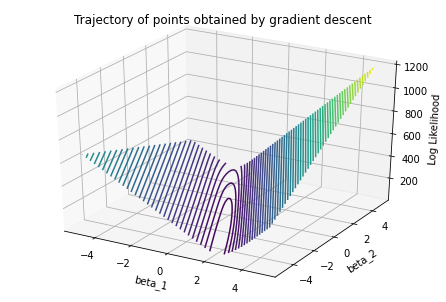

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

#Animation code inspired from https://www.bragitoff.com/2020/10/3d-trajectory-animated-using-matplotlib-python/

# The function used in animation call 
def func(num, trajectory_coord, line):
    # NOTE: there is no .set_data() for 3 dim data...
    line.set_data(trajectory_coord[0:2, :num])    
    line.set_3d_properties(trajectory_coord[2, :num])    
    return line

#generate the contours for function
beta1 = np.linspace(-5,5,100)
beta2 = np.linspace(-5,5,100)

beta_1, beta_2 = np.meshgrid(beta1, beta2)
Z = np.zeros([max(beta_1.shape),np.max(beta_2.shape)])
for i in range(Z.shape[0]):
  for j in range(Z.shape[1]):
    Z[i][j] = log_likelihood(beta_1[i][j], beta_2[i][j])

#run gradient descent and collect iterates
#change the values of tol, step_length, point and experiment yourselves
tol = 1e-2 #tolerance for gradient norm and stop criterion
step_length = 0.0001 # step length is assumed to be constant here 
point = np.array([4, 4]) #starting point 

points_fval_trajectory = grad_descent(tol, step_length, point)
#print(points_fval_trajectory)

numDataPoints = len(points_fval_trajectory[0])
#print('numDataPoints:',numDataPoints)
#print(points_fval_trajectory[0:2,:3])    

# Get handles to figure and axes
fig = plt.figure()
ax = Axes3D(fig)
 
ax.contour3D(beta_1, beta_2, Z, 75, cmap='viridis')

#Note: in 2d plots, we can pass empty arguments to plot function when initializing
#However, we need to pass data into 3d plot function, cannot pass empty arguments
line = plt.plot(points_fval_trajectory[0], points_fval_trajectory[1], points_fval_trajectory[2], lw=2, c='r')[0] # For line plot
 
# set axes properties
ax.set_xlabel('beta_1')
ax.set_ylabel('beta_2')
ax.set_zlabel('Log Likelihood')
ax.set_title('Trajectory of points obtained by gradient descent')
 
# Create Animation object
line_ani = animation.FuncAnimation(fig, func, frames=numDataPoints, fargs=(points_fval_trajectory,line), interval=100, blit=False)
#we can save the animation as a file 
#line_ani.save(r'AnimationNew.mp4')

#render the animation as a video and display it 
HTML(line_ani.to_html5_video())

#Gradient Descent with fixed step size

Initial values: beta_1: 0.8940438962026  beta_2: 0.38519067891297243  log likeihood: 172.38754759677488
k:  0  beta_1: 0.738110783794632  beta_2: 0.30115266856011497  grad norm: 177.1370168239913 log likeihood: 141.08777859729312
k:  100  beta_1: 0.13635251606933424  beta_2: -0.46835709836639544  grad norm: 3.6418475566385107 log likeihood: 25.418099353711355
k:  200  beta_1: 0.277328322165468  beta_2: -0.7565685573369064  grad norm: 2.830400521412747 log likeihood: 24.38455124157459
k:  300  beta_1: 0.38737198473096474  beta_2: -0.9836119484441264  grad norm: 2.25299025485136 log likeihood: 23.74593677837345
k:  400  beta_1: 0.47538898323180157  beta_2: -1.1664861345041526  grad norm: 1.8313223174356648 log likeihood: 23.33299234884087
k:  500  beta_1: 0.547248640769226  beta_2: -1.3165954579468284  grad norm: 1.5146758325926608 log likeihood: 23.05545857484138
k:  600  beta_1: 0.6069091100989734  beta_2: -1.44174468448994  grad norm: 1.2707113446578253 log likeihood: 22.8629170381115

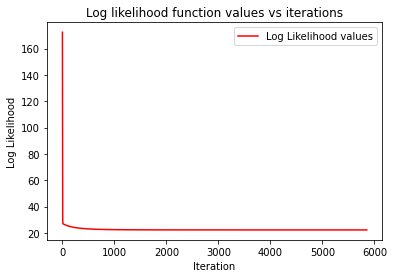

In [31]:
#gradient descent for likelihood maximization 
beta_1 = random.uniform(0, 1)
beta_2 = random.uniform(0, 1)
max_iter = 10000
eps_1 = 0.00001 #tolerance for gradient norm
eps_2 = 1e-9 #tolerance for relative function value difference

f_val = log_likelihood(beta_1,beta_2)

#store the objective function values for plotting purposes
gd_f_val_list = [] 
gd_f_val_list.append(f_val)

print('Initial values: beta_1:',beta_1, ' beta_2:',beta_2, ' log likeihood:', f_val)
#the loop 
for k in range(max_iter):
  
  grad_beta_1 = 0.0
  grad_beta_2= 0.0
  #pass through the data to compute gradients
  for i in range(n):
    x_i = X_train[i] #access element in training set
    y_i = float(y_train[i]) #access the label
    beta = np.array([beta_1, beta_2])
    p_i = 1.0/(1.0+np.exp(-y_i*np.dot(beta,x_i))) #probability with the current beta_0, beta_1
    grad_beta_1 +=  (1-p_i)*(-y_i*x_i[0])
    grad_beta_2 +=  (1-p_i)*(-y_i*x_i[1])
  
  #lr = linesearch(beta_1, beta_2, grad_beta_1, grad_beta_2, float(f_val_list[-1]))
  lr = 0.001
  beta_1 -= lr * grad_beta_1
  beta_2 -= lr * grad_beta_2
  #print('k: ', k, ' grad beta_1: ', grad_beta_1, 'grad beta_2: ',grad_beta_2, 'beta_1:', beta_1, 'beta_2:',beta_2)
  grad_norm = np.sqrt(grad_beta_1**2 + grad_beta_2**2)
  f_val = log_likelihood(beta_1,beta_2)
  gd_f_val_list.append(f_val)

  rel_change_in_fval = np.abs((f_val - gd_f_val_list[-2])/gd_f_val_list[-2])

  if k%100+1 == 1:
    print('k: ', k,  ' beta_1:', beta_1, ' beta_2:',beta_2, ' grad norm:', grad_norm, 'log likeihood:', f_val)
  if grad_norm <= eps_1 or rel_change_in_fval <= eps_2:
    break
print('Final: k: ', k,  ' beta_1:', beta_1, ' beta_2:',beta_2, ' grad norm:', grad_norm, 'log likeihood:', f_val)


#plot the function values during optimization 
plt.plot( gd_f_val_list, '-r', label='Log Likelihood values')
plt.title("Log likelihood function values vs iterations")
plt.xlabel("Iteration")
plt.ylabel("Log Likelihood")
plt.legend(loc='upper right')
#plt.grid()
plt.show()

#Gradient Descent with line search 

In [32]:
def linesearch(beta_1, beta_2, grad_beta_1, grad_beta_2, last_f_val):
  alpha_min = 10
  ratio = 1.0/10
  t = 9
  alphas = [alpha_min*ratio**i for i in range(t)]
  #print(alphas)
  for alpha in alphas:
    x1 = beta_1 - alpha*grad_beta_1
    x2 = beta_2 - alpha*grad_beta_2
    if log_likelihood(x1,x2) < last_f_val:
      return float(alpha)
  return 0.001

Initial values: beta_1: 0.7710086195595833  beta_2: 0.13232220089028368  log likeihood: 132.10184470335992
k:  0  beta_1: -0.7736031799387577  beta_2: -0.6998031905239745  grad norm: 175.44965882514092 log likeihood: 99.47259817715988


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: overflow encountered in exp
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in double_scalars
  if __name__ == '__main__':


k:  100  beta_1: 0.48952857698651936  beta_2: -1.2041462675810586  grad norm: 2.94175999470437 log likeihood: 23.263838101628707
k:  200  beta_1: 0.6998182311954293  beta_2: -1.6506862171913737  grad norm: 1.193530329204038 log likeihood: 22.621391428522152
k:  300  beta_1: 0.820531782207727  beta_2: -1.8888115798477583  grad norm: 1.2689488707439462 log likeihood: 22.424965456766085
k:  400  beta_1: 0.8875188316827154  beta_2: -2.037513756549739  grad norm: 0.5074094053296155 log likeihood: 22.353305118812248
k:  500  beta_1: 0.9325399832236164  beta_2: -2.13411276255963  grad norm: 0.542588350653728 log likeihood: 22.323770185300777
k:  600  beta_1: 0.9618610750647123  beta_2: -2.1973083959637245  grad norm: 0.21144317099216536 log likeihood: 22.31121932855342
k:  700  beta_1: 0.9824307299221082  beta_2: -2.237919419640519  grad norm: 0.20939618786534603 log likeihood: 22.305513074651184
k:  800  beta_1: 0.9958303841799264  beta_2: -2.2664592436346394  grad norm: 0.08636213425232042 

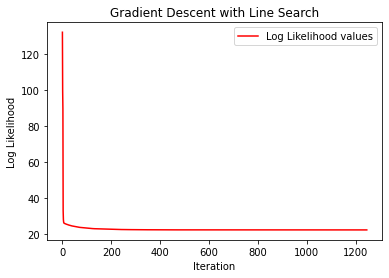

In [33]:
#gradient descent for likelihood maximization 
beta_1 = random.uniform(0, 1)
beta_2 = random.uniform(0, 1)
max_iter = 10000
eps_1 = 0.00001 #tolerance for gradient norm
eps_2 = 1e-9 #tolerance for relative function value difference

f_val = log_likelihood(beta_1,beta_2)

#store the objective function values for plotting purposes
gd_ls_f_val_list = [] 
gd_ls_f_val_list.append(f_val)

print('Initial values: beta_1:',beta_1, ' beta_2:',beta_2, ' log likeihood:', f_val)
#the loop 
for k in range(max_iter):
  
  grad_beta_1 = 0.0
  grad_beta_2= 0.0
  #pass through the data to compute gradients
  for i in range(n):
    x_i = X_train[i] #access element in training set
    y_i = float(y_train[i]) #access the label
    beta = np.array([beta_1, beta_2])
    p_i = 1.0/(1.0+np.exp(-y_i*np.dot(beta,x_i))) #probability with the current beta_0, beta_1
    grad_beta_1 +=  (1-p_i)*(-y_i*x_i[0])
    grad_beta_2 +=  (1-p_i)*(-y_i*x_i[1])
  if k==1:
    lr = 0.001
  else:
    lr = linesearch(beta_1, beta_2, grad_beta_1, grad_beta_2, float(gd_ls_f_val_list[-1]))
    #print(lr)
  beta_1 -= lr * grad_beta_1
  beta_2 -= lr * grad_beta_2
  #print('k: ', k, ' grad beta_1: ', grad_beta_1, 'grad beta_2: ',grad_beta_2, 'beta_1:', beta_1, 'beta_2:',beta_2)
  grad_norm = np.sqrt(grad_beta_1**2 + grad_beta_2**2)
  f_val = log_likelihood(beta_1,beta_2)
  gd_ls_f_val_list.append(f_val)

  rel_change_in_fval = np.abs((f_val - gd_ls_f_val_list[-2])/gd_ls_f_val_list[-2])

  if k%100+1 == 1:
    print('k: ', k,  ' beta_1:', beta_1, ' beta_2:',beta_2, ' grad norm:', grad_norm, 'log likeihood:', f_val)
  if grad_norm <= eps_1 or rel_change_in_fval <= eps_2:
    break
print('Final: k: ', k,  ' beta_1:', beta_1, ' beta_2:',beta_2, ' grad norm:', grad_norm, 'log likeihood:', f_val)


#plot the function values during optimization 
plt.plot( gd_ls_f_val_list, '-r', label='Log Likelihood values')
plt.title("Gradient Descent with Line Search")
plt.xlabel("Iteration")
plt.ylabel("Log Likelihood")
plt.legend(loc='upper right')
#plt.grid()
plt.show()

#Stochastic Gradient Descent

In [34]:
def create_mini_batches(X, y, batch_size):
    mini_batches = []
    y = y.reshape(-1, 1)
    data = np.hstack((X, y))
    np.random.shuffle(data)
    n_minibatches = data.shape[0] #batch_size
    i = 0
    for i in range(n_minibatches + 1):
      mini_batch = data[i * batch_size:(i + 1)*batch_size, :]
      X_mini = mini_batch[:, :-1]
      Y_mini = mini_batch[:, -1].reshape((-1, 1))
      mini_batches.append((X_mini, Y_mini))
    if data.shape[0] % batch_size != 0:
      mini_batch = data[i * batch_size:data.shape[0]]
      X_mini = mini_batch[:, :-1]
      Y_mini = mini_batch[:, -1].reshape((-1, 1))
      mini_batches.append((X_mini, Y_mini))
    return mini_batches


Initial values: beta_1: 0.7564269681489288  beta_2: 0.7775098539449455  log likeihood: 183.90698075817835
k:  0  beta_1: 0.6006173534839193  beta_2: 0.6935167494027468 log likeihood: 152.5736581521291
k:  100  beta_1: -0.0006692749011928635  beta_2: -0.18770217827829302 log likeihood: 26.684641302931432
k:  200  beta_1: 0.17414607029518975  beta_2: -0.5408320982893722 log likeihood: 25.130879229194036
k:  300  beta_1: 0.3058388163638847  beta_2: -0.814635331094854 log likeihood: 24.206877242847643
k:  400  beta_1: 0.40893610521686624  beta_2: -1.031292407855184 log likeihood: 23.631612751734284
k:  500  beta_1: 0.49411370898647966  beta_2: -1.2055254850715966 log likeihood: 23.25569642542668
k:  600  beta_1: 0.5625776821916412  beta_2: -1.3495071109997532 log likeihood: 23.001783697504045
k:  700  beta_1: 0.622309412048046  beta_2: -1.4686973184049399 log likeihood: 22.825516955961792
k:  800  beta_1: 0.6663215529510141  beta_2: -1.5724228181049626 log likeihood: 22.698931665825807
k: 

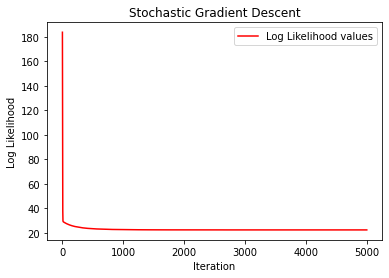

In [35]:
#stochastic gradient descent for likelihood minimization 
beta_1 = random.uniform(0, 1)
beta_2 = random.uniform(0, 1)
max_epochs = 5000
eps_1 = 1e-9 #tolerance for gradient norm
eps_2 = 1e-9 #tolerance for relative function value difference

f_val = log_likelihood(beta_1,beta_2)

#store the objective function values for plotting purposes
sgd_f_val_list = [] 
sgd_f_val_list.append(f_val)

print('Initial values: beta_1:',beta_1, ' beta_2:',beta_2, ' log likeihood:', f_val)
#the loop
#lr = linesearch(beta_0, beta_1, grad_beta_0, grad_beta_1, float(f_val_list[-1]))
lr = 0.001
batch_size = 1
for k in range(max_epochs):
  mini_batches = create_mini_batches(X_train, y_train, batch_size)
  for mini_batch in mini_batches:
    X_mini, y_mini = mini_batch
    grad_beta_1 = 0.0
    grad_beta_2 = 0.0
    for i in range(len(X_mini)):
      x_i = X_mini[i] #access element in training set
      y_i = float(y_mini[i]) #access the label
      beta = np.array([beta_1, beta_2])
      p_i = 1.0/(1.0+np.exp(-y_i*np.dot(beta,x_i))) #probability with the current beta_1, beta_2
      grad_beta_1 +=  (1-p_i)*(-y_i*x_i[0])
      grad_beta_2 +=  (1-p_i)*(-y_i*x_i[1])
    beta_1 -= lr * grad_beta_1
    beta_2 -= lr * grad_beta_2
  #print('k: ', k, ' grad beta_1: ', grad_beta_1, 'grad beta_2: ',grad_beta_2, 'beta_1:', beta_1, 'beta_2:',beta_2)
  #grad_norm = np.sqrt(grad_beta_1**2 + grad_beta_2**2)
  f_val = log_likelihood(beta_1,beta_2)
  sgd_f_val_list.append(f_val)

  rel_change_in_fval = np.abs((f_val - sgd_f_val_list[-2])/sgd_f_val_list[-2])
  if k%100+1 == 1:
    print('k: ', k,  ' beta_1:', beta_1, ' beta_2:',beta_2, 'log likeihood:', f_val)
  if rel_change_in_fval <= eps_2:
    break
print('Final: k: ', k,  ' beta_1:', beta_1, ' beta_2:',beta_2, 'log likeihood:', f_val)


#plot the function values during optimization 
plt.plot( sgd_f_val_list, '-r', label='Log Likelihood values')
plt.title("Stochastic Gradient Descent")
plt.xlabel("Iteration")
plt.ylabel("Log Likelihood")
plt.legend(loc='upper right')
#plt.grid()
plt.show()

#Minibatch Stochastic Gradient Descent

Initial values: beta_1: 0.6974020660020287  beta_2: 0.9005607466251498  log likeihood: 185.04678690120562
k:  0  beta_1: 0.5414887447839222  beta_2: 0.8165080742235271 log likeihood: 153.68938061756944
k:  100  beta_1: -0.044756756174116355  beta_2: -0.09310038252755565 log likeihood: 27.17099642841684
k:  200  beta_1: 0.13763991936389622  beta_2: -0.4700506547717133 log likeihood: 25.410557141410823
k:  300  beta_1: 0.2787966739410627  beta_2: -0.7583899964303755 log likeihood: 24.378176128376655
k:  400  beta_1: 0.3879323304647867  beta_2: -0.9855050426169639 log likeihood: 23.741581397239976
k:  500  beta_1: 0.4762605442525446  beta_2: -1.168313934200352 log likeihood: 23.329295386893204
k:  600  beta_1: 0.5489338741285231  beta_2: -1.3180336988435606 log likeihood: 23.052563306682288
k:  700  beta_1: 0.6132812241462821  beta_2: -1.4409415014849412 log likeihood: 22.86767198447041
k:  800  beta_1: 0.6558556283042044  beta_2: -1.5501228272053469 log likeihood: 22.72481647637553
k:  9

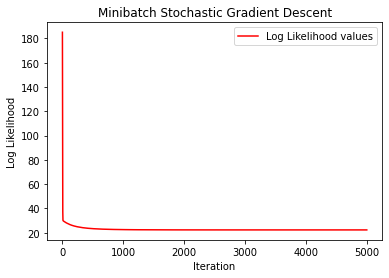

In [38]:
#minibatch stochastic gradient descent for likelihood maximization 
beta_1 = random.uniform(0, 1)
beta_2 = random.uniform(0, 1)
max_epochs = 5000
eps_1 = 1e-9 #tolerance for gradient norm
eps_2 = 1e-9 #tolerance for relative function value difference

f_val = log_likelihood(beta_1,beta_2)

#store the objective function values for plotting purposes
msgd_f_val_list = [] 
msgd_f_val_list.append(f_val)

print('Initial values: beta_1:',beta_1, ' beta_2:',beta_2, ' log likeihood:', f_val)
#the loop
#lr = linesearch(beta_0, beta_1, grad_beta_0, grad_beta_1, float(f_val_list[-1]))
lr = 0.001
batch_size = 15
for k in range(max_epochs):
  mini_batches = create_mini_batches(X_train, y_train, batch_size)
  for mini_batch in mini_batches:
    X_mini, y_mini = mini_batch
    grad_beta_1 = 0.0
    grad_beta_2 = 0.0
    for i in range(len(X_mini)):
      x_i = X_mini[i] #access element in training set
      y_i = float(y_mini[i]) #access the label
      beta = np.array([beta_1, beta_2])
      p_i = 1.0/(1.0+np.exp(-y_i*np.dot(beta,x_i))) #probability with the current beta_1, beta_2
      grad_beta_1 +=  (1-p_i)*(-y_i*x_i[0])
      grad_beta_2 +=  (1-p_i)*(-y_i*x_i[1])
    beta_1 -= lr * grad_beta_1
    beta_2 -= lr * grad_beta_2
  #print('k: ', k, ' grad beta_1: ', grad_beta_1, 'grad beta_2: ',grad_beta_2, 'beta_1:', beta_1, 'beta_2:',beta_2)
  grad_norm = np.sqrt(grad_beta_1**2 + grad_beta_2**2)
  f_val = log_likelihood(beta_1,beta_2)
  msgd_f_val_list.append(f_val)

  rel_change_in_fval = np.abs((f_val - msgd_f_val_list[-2])/msgd_f_val_list[-2])
  if k%100+1 == 1:
    print('k: ', k,  ' beta_1:', beta_1, ' beta_2:',beta_2, 'log likeihood:', f_val)
  if rel_change_in_fval <= eps_2:
    break
print('Final: k: ', k,  ' beta_1:', beta_1, ' beta_2:',beta_2, 'log likeihood:', f_val)


#plot the function values during optimization 
plt.plot( msgd_f_val_list, '-r', label='Log Likelihood values')
plt.title("Minibatch Stochastic Gradient Descent")
plt.xlabel("Iteration")
plt.ylabel("Log Likelihood")
plt.legend(loc='upper right')
#plt.grid()
plt.show()

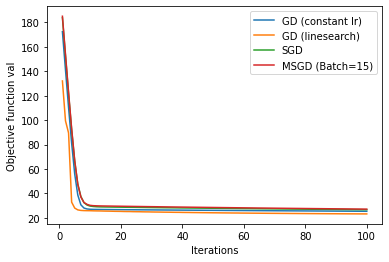

In [44]:
fig, ax = plt.subplots(1,1)
maxiter = 100
ax.plot(np.arange(1,min(maxiter+1,len(gd_f_val_list)+1)),gd_f_val_list[:min(maxiter,len(gd_f_val_list))])
ax.plot(np.arange(1,min(maxiter+1,len(gd_ls_f_val_list)+1)),gd_ls_f_val_list[:min(maxiter,len(gd_ls_f_val_list))])
ax.plot(np.arange(1,min(maxiter+1,len(sgd_f_val_list)+1)),sgd_f_val_list[:min(maxiter,len(sgd_f_val_list))])
ax.plot(np.arange(1,min(maxiter+1,len(msgd_f_val_list)+1)),msgd_f_val_list[:min(maxiter,len(msgd_f_val_list))])

ax.set_xlabel('Iterations')
ax.set_ylabel('Objective function val')

ax.legend(['GD (constant lr)', 'GD (linesearch)', 'SGD', 'MSGD (Batch=15)'])
plt.show()
